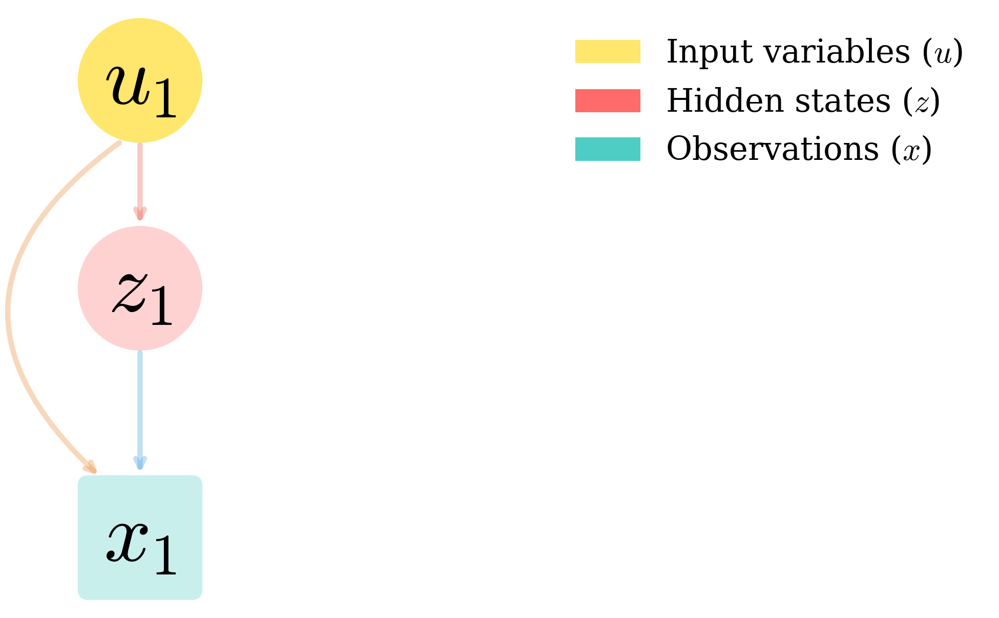

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, ConnectionPatch
import matplotlib.patches as mpatches
import shutil
from IPython.display import HTML

# Prefer full LaTeX rendering when available; otherwise use Computer Modern mathtext.
use_tex = shutil.which('latex') is not None
plt.rcParams.update({
    'text.usetex': use_tex,
    'font.family': 'serif',
    'font.serif': ['Computer Modern Roman', 'CMU Serif', 'DejaVu Serif'],
    'mathtext.fontset': 'cm',
    'mathtext.default': 'it',
})

FONT_SCALE = 6
NODE_FONT_SIZE = 13 * FONT_SCALE
LEGEND_FONT_SIZE = 5 * FONT_SCALE
TOTAL_FRAMES = 50
NODE_EDGE_WIDTH = 0
ARROW_WIDTH = 5

def setup_axes(ax):
    ax.set_xlim(0.8, 10.2)
    ax.set_ylim(-0.1, 5.7)
    ax.set_aspect('equal', adjustable='box')
    ax.axis('off')

# Set up the figure
fig, ax = plt.subplots(figsize=(14, 8), dpi=150)
fig.subplots_adjust(left=0.01, right=0.99, bottom=0.01, top=0.99)
setup_axes(ax)

# Number of time steps to show
n_timesteps = 4

# Colors
hidden_color = '#FF6B6B'
observed_color = '#4ECDC4'
input_color = '#FFE66D'
arrow_color = '#2C3E50'

def draw_node(ax, x, y, label, color, size=0.6):
    """Draw a circular node"""
    circle = plt.Circle((x, y), size, color=color, ec='black', linewidth=NODE_EDGE_WIDTH, zorder=3)
    ax.add_patch(circle)
    ax.text(x, y, label, ha='center', va='center', fontsize=NODE_FONT_SIZE, zorder=4)
    return circle

def draw_square_node(ax, x, y, label, color, size=0.5):
    """Draw a square node (for observed variables)"""
    square = FancyBboxPatch((x-size, y-size), size*2, size*2,
                            boxstyle="round,pad=0.1",
                            color=color, ec='black', linewidth=NODE_EDGE_WIDTH, zorder=3)
    ax.add_patch(square)
    ax.text(x, y, label, ha='center', va='center', fontsize=NODE_FONT_SIZE, zorder=4)
    return square

def draw_arrow(ax, x1, y1, x2, y2, style='solid', color=arrow_color, width=ARROW_WIDTH):
    """Draw an arrow between two points"""
    arrow = FancyArrowPatch((x1, y1), (x2, y2),
                           arrowstyle='->', mutation_scale=20,
                           linewidth=width, color=color,
                           linestyle=style, zorder=2)
    ax.add_patch(arrow)
    return arrow

# Animation function
def animate(frame):
    ax.clear()
    setup_axes(ax)

    # Determine how many time steps to show based on frame
    visible_steps = min((frame // 10) + 1, n_timesteps)
    current_step = frame // 10

    # Draw input nodes (top row)
    input_y = 5
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3
        node = draw_node(ax, x, input_y, rf'$u_{{{t+1}}}$', input_color, size=0.6)
        node.set_alpha(alpha)

    # Draw hidden state nodes (middle row)
    hidden_y = 3
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10 + 3:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3
        node = draw_node(ax, x, hidden_y, rf'$z_{{{t+1}}}$', hidden_color, size=0.6)
        node.set_alpha(alpha)

    # Draw observation nodes (bottom row)
    obs_y = 0.6
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10 + 6:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3
        node = draw_square_node(ax, x, obs_y, rf'$x_{{{t+1}}}$', observed_color, size=0.5)
        node.set_alpha(alpha)

    # Draw arrows from input to hidden state
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10 + 2:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3
        arrow = draw_arrow(ax, x, input_y - 0.6, x, hidden_y + 0.6, color='#E74C3C', width=ARROW_WIDTH)
        arrow.set_alpha(alpha)

    # Draw arrows from hidden state to observation
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10 + 5:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3
        arrow = draw_arrow(ax, x, hidden_y - 0.6, x, obs_y + 0.6, color='#3498DB', width=ARROW_WIDTH)
        arrow.set_alpha(alpha)

    # Draw transition arrows between hidden states
    for t in range(visible_steps - 1):
        x1 = 2 + t * 2.5
        x2 = 2 + (t + 1) * 2.5
        if frame >= (t + 1) * 10 + 1:
            alpha = 1.0 if (t == current_step or t + 1 == current_step) else 0.4
        else:
            alpha = 0.3
        arrow = draw_arrow(ax, x1 + 0.6, hidden_y, x2 - 0.6, hidden_y,
                          color='#9B59B6', width=ARROW_WIDTH)
        arrow.set_alpha(alpha)

    # Draw curved arrows from input to observations (curving from the left)
    for t in range(visible_steps):
        x = 2 + t * 2.5
        if frame >= t * 10 + 7:
            alpha = 1.0 if t == current_step else 0.4
        else:
            alpha = 0.3

        arrow = ConnectionPatch((x - 0.2, input_y - 0.6), (x - 0.4, obs_y + 0.6),
                               'data', 'data',
                               arrowstyle='->', shrinkA=0, shrinkB=0,
                               mutation_scale=20, fc=arrow_color, linewidth=ARROW_WIDTH,
                               connectionstyle='arc3,rad=0.6', color='#E67E22', zorder=2)
        ax.add_artist(arrow)
        arrow.set_alpha(alpha)

    # Draw legend only during the first quarter of the loop.
    if frame < TOTAL_FRAMES // 4:
        legend_elements = [
            mpatches.Patch(color=input_color, label=r'Input variables ($u$)'),
            mpatches.Patch(color=hidden_color, label=r'Hidden states ($z$)'),
            mpatches.Patch(color=observed_color, label=r'Observations ($x$)'),
        ]
        ax.legend(handles=legend_elements, loc='upper right', fontsize=LEGEND_FONT_SIZE, frameon=False)

    return []

# Create animation
anim = FuncAnimation(fig, animate, frames=TOTAL_FRAMES, interval=100, blit=False, repeat=True)


In [2]:
HTML(anim.to_jshtml())

In [3]:
# Save as GIF
print("Saving animation...")
writer = PillowWriter(fps=10)
anim.save(
    'idhmm_animation.gif',
    writer=writer,
    dpi=150,
    savefig_kwargs={'bbox_inches': 'tight', 'pad_inches': 0.02},
)
print("Animation saved successfully!")

plt.close()

Saving animation...
Animation saved successfully!
